In [1]:
from google.colab import files
up = "m"
while not ((up == "f") or (up=="u")):
  print("Do you want to use a url or your own file? [U/f]")
  up = input().lower()[0]

if(up == "u"):
  print("Type your image url here: ")
  url = input()
else:
  im = files.upload()

Do you want to use a url or your own file? [U/f]
u
Type your image url here: 
kc;sfe


In [2]:
#install dependencies: (use cu101 because colab has CUDA 10.1)
!pip3 install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip3 install cython pyyaml==5.1
!pip3 install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
     |████████████████████████████████| 276kB 2.7MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=9b53b55650a9521f952db10e9d6fa0a6eece2a1e45d25a322c6a05adef55e6c7
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-e54ip9up
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-e54ip9up
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-lin

In [3]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 530kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200607-cp36-none-any.whl size=41028 sha256=da31e291f2478962ccb8ec17f304b527a3525163b25ddf7e4044faacdf43a34c
  Stored in directory: /root/.cache/pip/wheels/5f/d6/68/b36c8d0b4a602e5c86b4010142aa7744b46c1556afd29544bc
Successfully built fvcore


In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

This is where we get images, we'll replace that url with our own


--2020-06-07 15:32:56--  http://kc/
Resolving kc (kc)... failed: Name or service not known.
wget: unable to resolve host address ‘kc’
/bin/bash: sfe: command not found
--2020-06-07 15:32:57--  https://www.wedaways.com/wp-content/uploads/2019/10/hotel-room-blocks.jpg
Resolving www.wedaways.com (www.wedaways.com)... 23.185.0.3
Connecting to www.wedaways.com (www.wedaways.com)|23.185.0.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 349362 (341K) [image/jpeg]
Saving to: ‘input.jpg’

input.jpg           100%[===================>] 341.17K  --.-KB/s    in 0.06s   

2020-06-07 15:32:57 (6.04 MB/s) - ‘input.jpg’ saved [349362/349362]



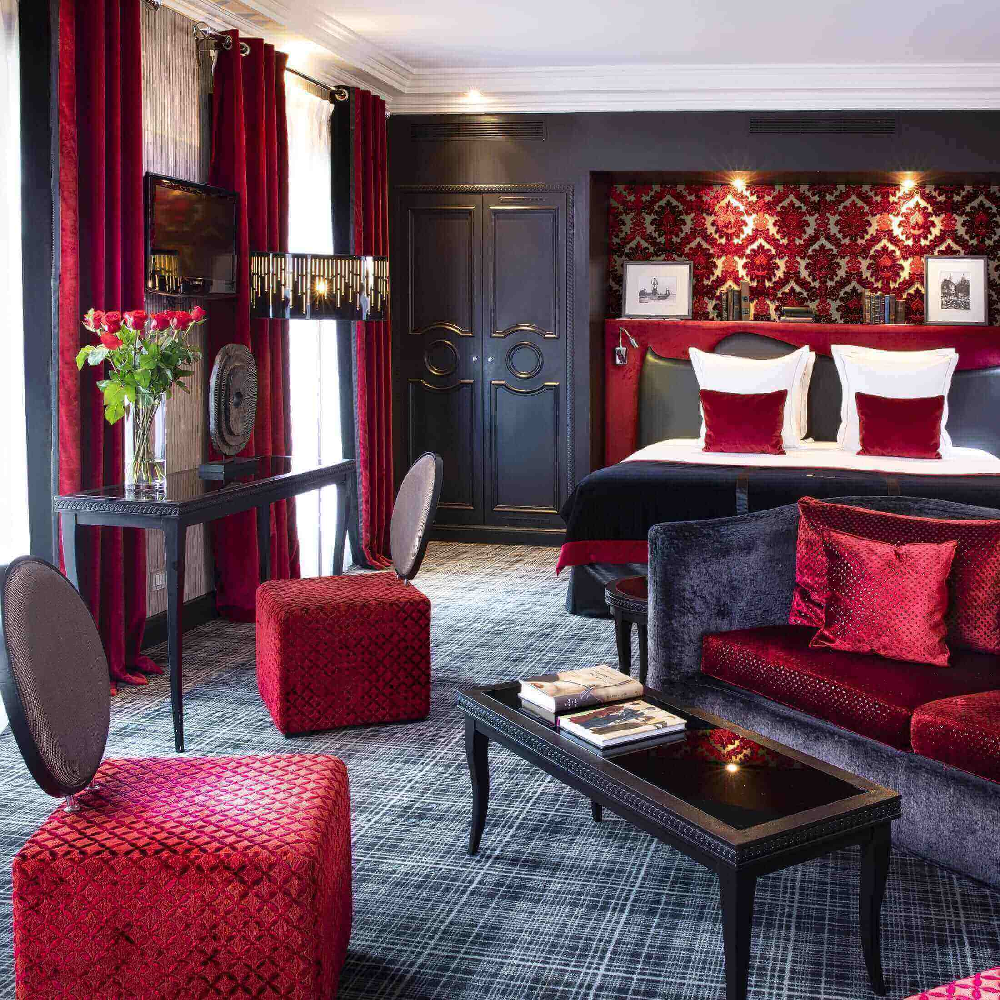

In [6]:
if(up=="u"):
  try:
    !wget $url -O input.jpg
    im = cv2.imread("./input.jpg")
    cv2_imshow(im)
  except:
    !wget "https://www.wedaways.com/wp-content/uploads/2019/10/hotel-room-blocks.jpg" -O input.jpg
    im = cv2.imread("./input.jpg")
    cv2_imshow(im)
else:
  try:
    cv2_imshow(im)
  except:
    !wget "https://www.wedaways.com/wp-content/uploads/2019/10/hotel-room-blocks.jpg" -O input.jpg
    im = cv2.imread("./input.jpg")
    cv2_imshow(im)



In [7]:

cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_f10217.pkl: 178MB [00:08, 20.1MB/s]                           


this removes the prediction boxes from the images

In [8]:
print(outputs["instances"].pred_boxes)
outputs["instances"].pred_boxes = torch.tensor([np.zeros(4) for i in range(outputs["instances"].pred_boxes.__len__())], device='cuda:0')
print(outputs["instances"].pred_boxes)

Boxes(tensor([[1230.1167, 1543.3395, 1519.4783, 1654.8198],
        [ 560.8475,  988.3260,  983.5565, 1646.8593],
        [ 272.7719,  863.3138,  372.6850, 1095.3689],
        [1427.5112, 1082.6392, 2195.6609, 1949.1409],
        [1143.3835, 1508.5966, 1346.0179, 1576.2975],
        [1833.1023,  754.2587, 2112.9482, 1040.0844],
        [   3.0452, 1209.5648,  243.4763, 1764.3420],
        [   3.2966, 1205.5214,  786.3300, 2167.4446],
        [ 172.8859,  669.1857,  442.9029, 1089.7375],
        [1201.4645,  712.7395, 2200.0000, 1356.4156],
        [ 858.3810,  991.9942,  977.5250, 1278.0674],
        [1146.4690, 1489.2373, 1322.7849, 1554.0305],
        [1133.9089, 1466.0592, 1413.8822, 1571.0591],
        [1504.2156,  747.2308, 1779.4446, 1017.6279]], device='cuda:0'))
tensor([[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0.

v.get_image() is our output

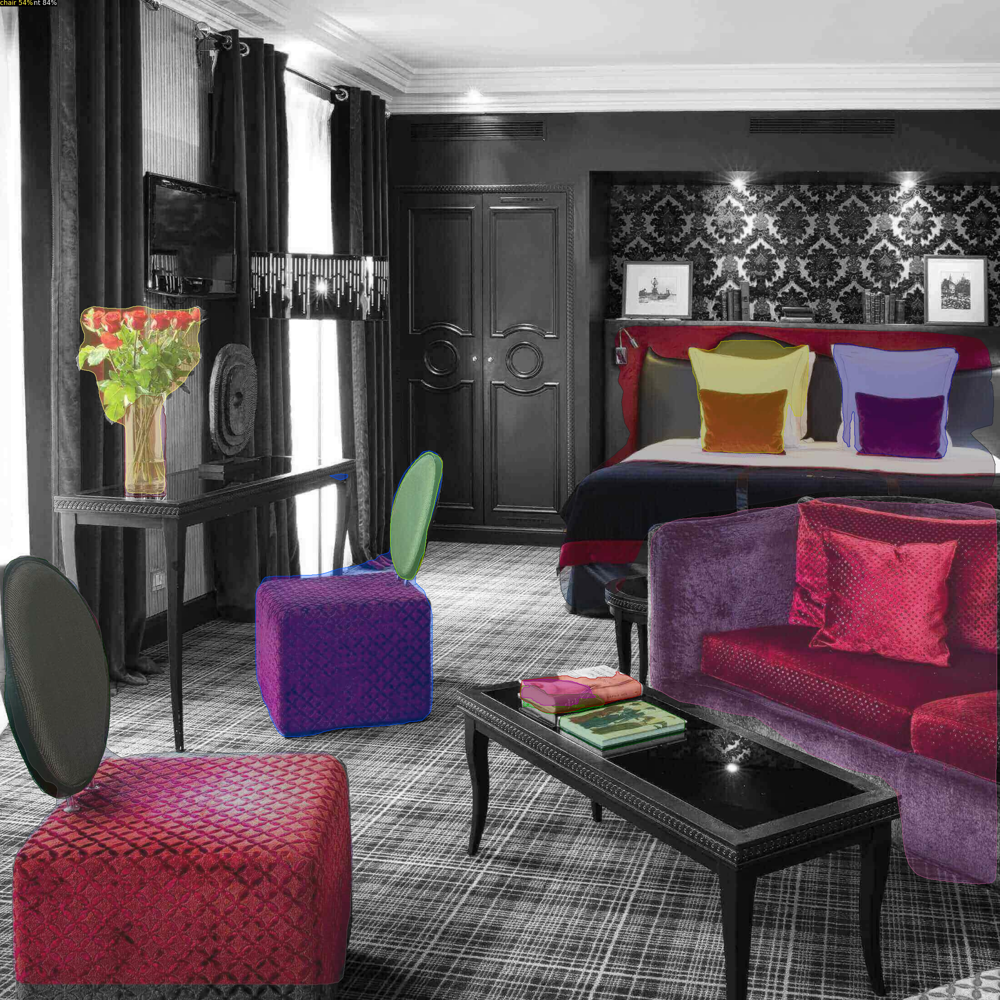

In [9]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2, instance_mode=detectron2.utils.visualizer.ColorMode.IMAGE_BW)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
image_final = v.get_image()[:, :, ::-1]
cv2_imshow(image_final)

In [0]:
cv2.imwrite("HTNE_stage.jpg", image_final)
files.download("input.jpg")
files.download("HTNE_stage.jpg")